<a href="https://colab.research.google.com/github/Payal-mak/Digital-Signal-Image-Processing/blob/main/Case_Study_on_Image_Processing_%26_Signal_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, exposure
from scipy.ndimage import zoom
from scipy.signal import correlate2d, convolve2d

# **Task 1: Image Representation and Signal Analysis**

**Part A: Continuous and Discrete Time Signals (Sine Wave)**

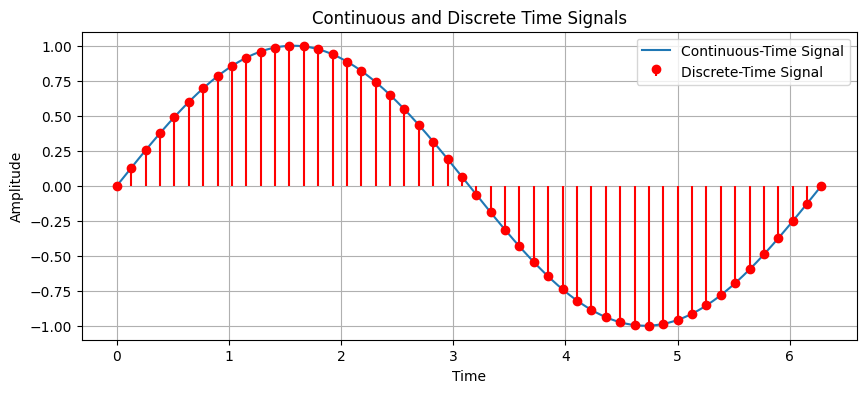

In [ ]:
def part_a_continuous_discrete_signal():
    # continuous-time signal (sine wave)
    t_cont = np.linspace(0, 2*np.pi, 1000)
    x_cont = np.sin(t_cont)

    # Discretize the signal
    t_disc = np.linspace(0, 2*np.pi, 50)
    x_disc = np.sin(t_disc)
    plt.figure(figsize=(10,4))
    plt.plot(t_cont, x_cont, label='Continuous-Time Signal')
    plt.stem(t_disc, x_disc, linefmt='r-', markerfmt='ro', basefmt=' ', label='Discrete-Time Signal')
    plt.title('Continuous and Discrete Time Signals')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
part_a_continuous_discrete_signal()


**Part B: Image Representation as Discrete-Time Signal**

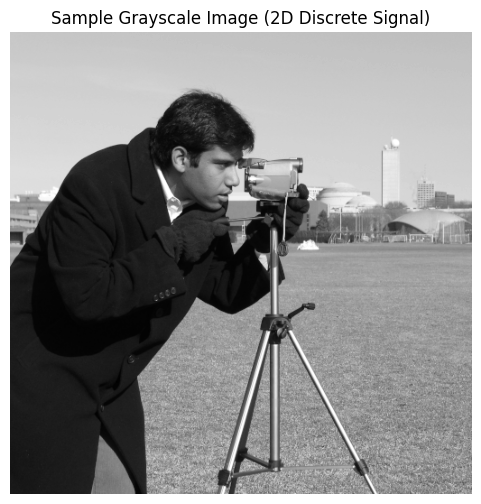

2D array of pixel values (image matrix):
[[200 200 200 ... 189 190 190]
 [200 199 199 ... 190 190 190]
 [199 199 199 ... 190 190 190]
 ...
 [ 25  25  27 ... 139 122 147]
 [ 25  25  26 ... 158 141 168]
 [ 25  25  27 ... 151 152 149]]


In [ ]:
def part_b_image_representation():
    img = data.camera()
    plt.figure(figsize=(6,6))
    plt.imshow(img, cmap='gray')
    plt.title('Sample Grayscale Image (2D Discrete Signal)')
    plt.axis('off')
    plt.show()
    print('2D array of pixel values (image matrix):')
    print(img)
part_b_image_representation()

**Image Zooming and Shrinking:**

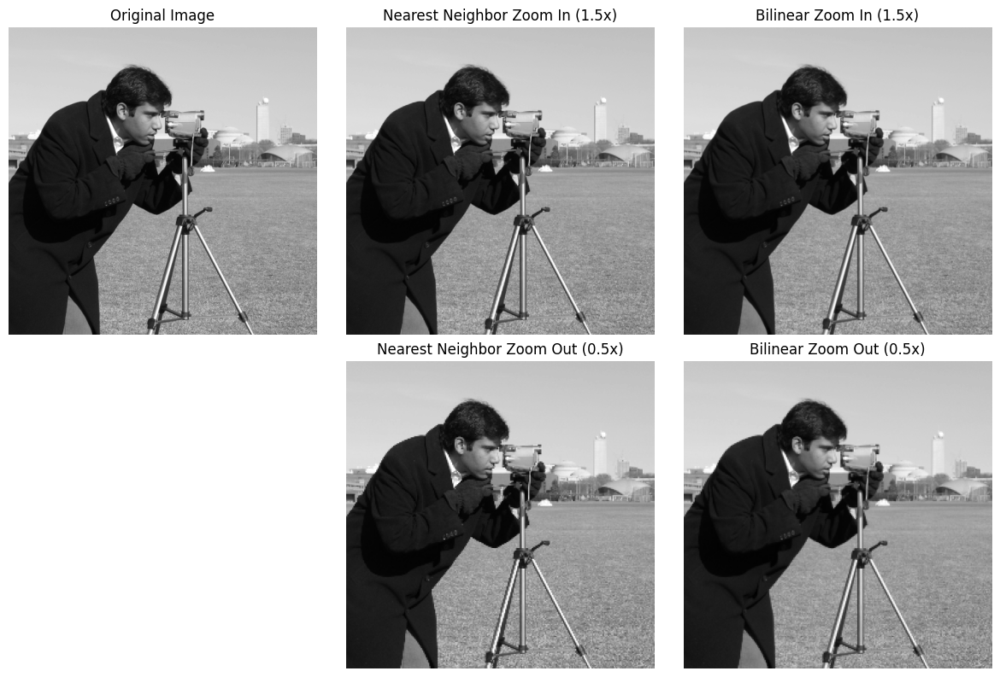

In [ ]:
def zoom_nearest(image, zoom_factor):
    #Zoom image using nearest neighbor interpolation
    return zoom(image, zoom_factor, order=0)

def zoom_bilinear(image, zoom_factor):
    #Zoom image using bilinear interpolation
    return zoom(image, zoom_factor, order=1)
image = data.camera()

zoom_in_factor = 1.5
zoom_out_factor = 0.5

zoomed_nearest_in = zoom_nearest(image, zoom_in_factor)
zoomed_bilinear_in = zoom_bilinear(image, zoom_in_factor)

zoomed_nearest_out = zoom_nearest(image, zoom_out_factor)
zoomed_bilinear_out = zoom_bilinear(image, zoom_out_factor)
plt.figure(figsize=(12,8))

plt.subplot(2,3,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(zoomed_nearest_in, cmap='gray')
plt.title('Nearest Neighbor Zoom In (1.5x)')
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(zoomed_bilinear_in, cmap='gray')
plt.title('Bilinear Zoom In (1.5x)')
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(zoomed_nearest_out, cmap='gray')
plt.title('Nearest Neighbor Zoom Out (0.5x)')
plt.axis('off')

plt.subplot(2,3,6)
plt.imshow(zoomed_bilinear_out, cmap='gray')
plt.title('Bilinear Zoom Out (0.5x)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Analysis: Effects of Image Resolution and Aliasing When Zooming In**
* Image resolution determines the amount of detail available: higher resolution means more pixels and finer detail.

* When you zoom in on a low-resolution image, individual pixels become visible, causing pixelation and blurring.

* Aliasing occurs when high-frequency details (fine textures, edges) exceed the sampling limit and are undersampled during resizing, causing visual distortions such as jagged edges and more patterns.

* Nearest neighbor interpolation preserves hard edges but results in blocky, pixelated images.

* Bilinear interpolation smooths transitions by averaging pixels but may blur edges and fine details.

* To mitigate aliasing, anti-aliasing filters (low-pass filters) can be applied before downscaling, or images at higher resolutions should be used when zooming in.

Spatial Resolution and Gray Level Resolution Impact on Image Quality
Spatial resolution refers to the number of pixels in an image (width × height). Higher spatial resolution means more pixels representing finer details. Increasing spatial resolution improves image sharpness and clarity, enabling better recognition of small features. Reducing spatial resolution causes loss of detail and blurriness because fewer pixels are available to represent the image.

Gray level resolution (also called intensity resolution or bit depth) refers to the number of distinct intensity (brightness) levels each pixel can take. For example, an 8-bit grayscale image has 256 gray levels. Higher gray level resolution provides smooth gradation of tones, richer contrast, and more accurate rendering of subtle features. Lowering gray level resolution reduces tonal detail, causing visible banding or posterization where smooth gradients appear as discrete steps.

Both spatial and gray level resolution greatly affect perceived image quality. High spatial resolution with low gray level resolution results in sharp but posterized images. High gray level resolution with low spatial resolution results in smooth but blurry images.

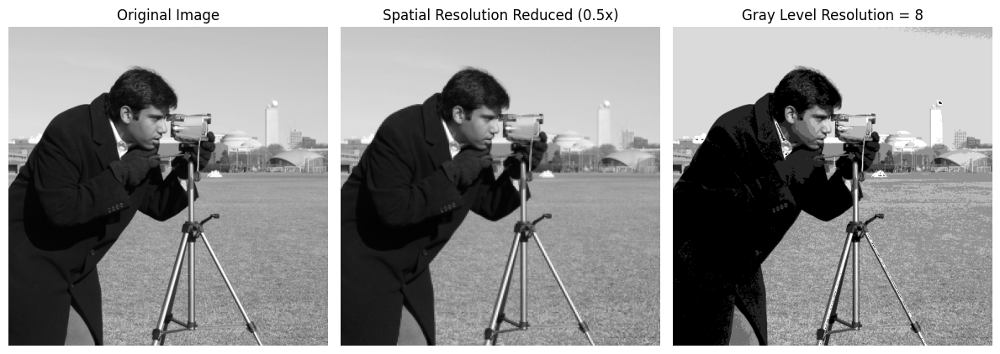

In [ ]:
def change_spatial_resolution(image, scale_factor):
    return zoom(image, scale_factor, order=1)
def change_gray_level_resolution(image, num_levels):
    max_val = image.max()
    bins = np.linspace(0, max_val, num_levels + 1)
    quantized = np.digitize(image, bins) - 1
    return (quantized / (num_levels - 1) * max_val).astype(image.dtype)
image = data.camera()
image_spatial_reduced = change_spatial_resolution(image, 0.5)
image_gray_reduced = change_gray_level_resolution(image, 8)
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(image_spatial_reduced, cmap='gray')
plt.title('Spatial Resolution Reduced (0.5x)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(image_gray_reduced, cmap='gray')
plt.title('Gray Level Resolution = 8')
plt.axis('off')

plt.tight_layout()
plt.show()

**A) Compute Cross-Correlation and Convolution of an Image with a Kernel**

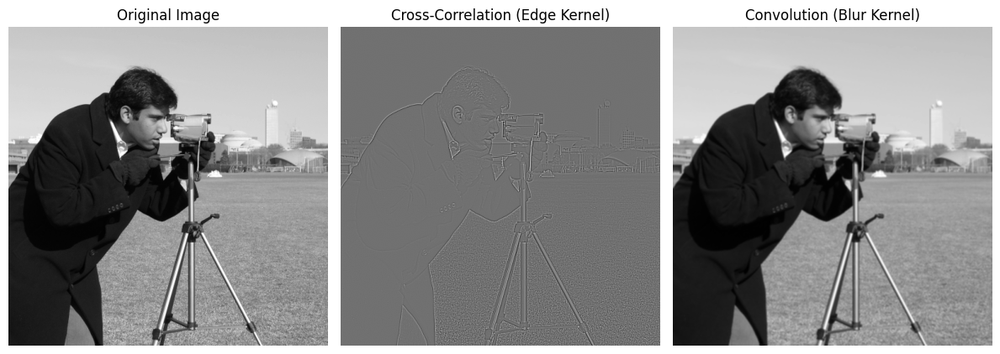

In [ ]:
def cross_correlation(image, kernel):
    return correlate2d(image, kernel, mode='same', boundary='symm')
def convolution(image, kernel):
    return convolve2d(image, kernel, mode='same', boundary='symm')
edge_kernel = np.array([[-1, -1, -1],
                        [-1,  8, -1],
                        [-1, -1, -1]])

blur_kernel = np.ones((3, 3)) / 9
image = data.camera()
corr_result = cross_correlation(image, edge_kernel)
conv_result = convolution(image, blur_kernel)
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(corr_result, cmap='gray')
plt.title('Cross-Correlation (Edge Kernel)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(conv_result, cmap='gray')
plt.title('Convolution (Blur Kernel)')
plt.axis('off')

plt.tight_layout()
plt.show()

**(B) Difference Between Correlation and Convolution in Image Processing**
* Correlation involves sliding the kernel over the image and computing a sum of element-wise products without flipping the kernel. It is used for template matching and detecting patterns that resemble the kernel.

* Convolution is similar but requires flipping the kernel both horizontally and vertically before sliding it across the image. This flipping changes the effect of the kernel and is fundamental in many image processing operations such as filtering and feature extraction.

* In many practical image processing tasks, especially with symmetric kernels, correlation and convolution produce very similar or identical results. However, the concept of convolution plays a central role in defining linear shift-invariant systems and neural network operations.

* To summarize, correlation measures similarity between the kernel and sections of the image, while convolution applies a transformation to the image based on the kernel.

# **Task 2: Image Processing Techniques**

**Gray Level Transformations and Histogram Processing:**

**(A)Common Gray-Level Transformations**

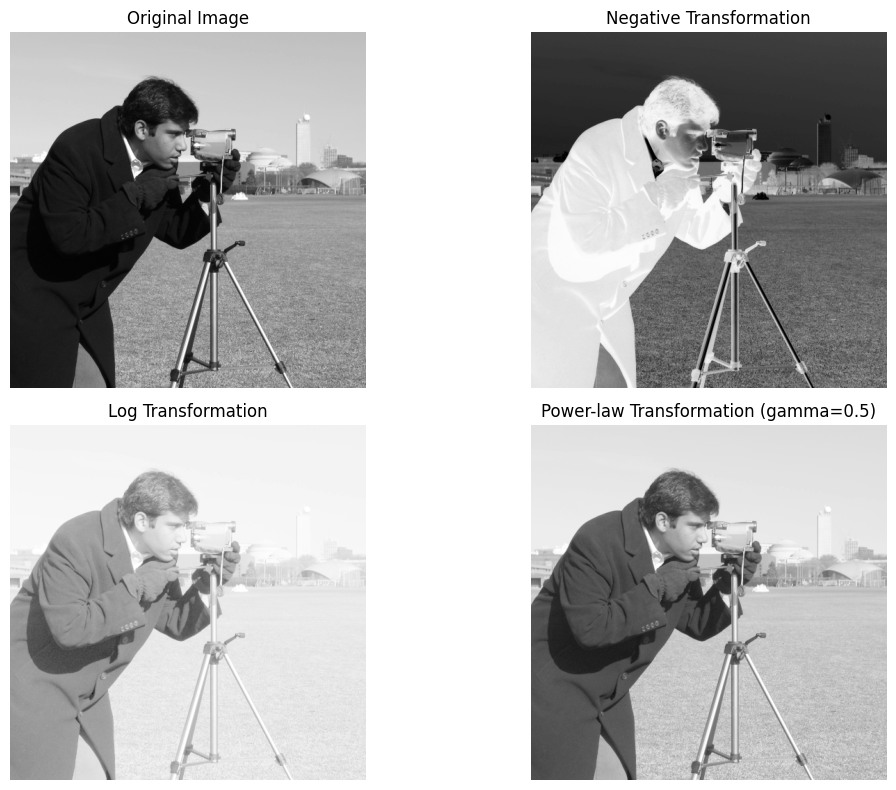

In [ ]:
def negative_transform(image):
    return 255 - image

def log_transform(image):
    c = 255 / np.log(1 + np.max(image))
    return (c * np.log1p(image)).astype(np.uint8)

def power_law_transform(image, gamma):
    normalized = image / 255.0
    corrected = np.power(normalized, gamma)
    return (corrected * 255).astype(np.uint8)

image = data.camera()
negative_img = negative_transform(image)
log_img = log_transform(image)
gamma_img = power_law_transform(image, gamma=0.5)
plt.figure(figsize=(12,8))
plt.subplot(221)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(222)
plt.imshow(negative_img, cmap='gray')
plt.title('Negative Transformation')
plt.axis('off')

plt.subplot(223)
plt.imshow(log_img, cmap='gray')
plt.title('Log Transformation')
plt.axis('off')

plt.subplot(224)
plt.imshow(gamma_img, cmap='gray')
plt.title('Power-law Transformation (gamma=0.5)')
plt.axis('off')

plt.tight_layout()
plt.show()

**(B) Compute and Display Histogram and Perform Histogram Equalization**

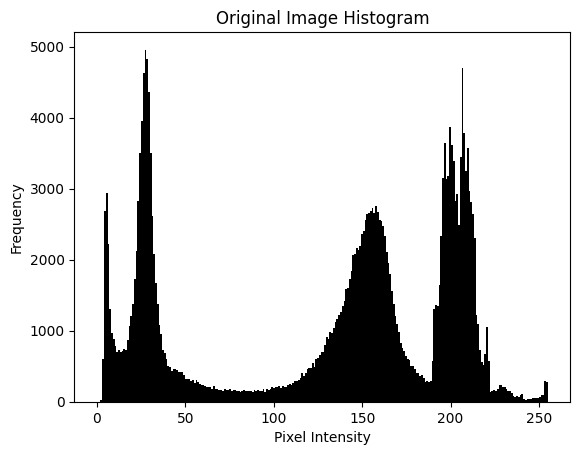

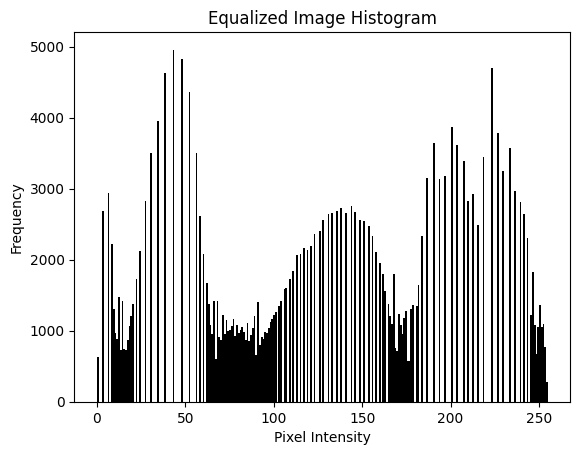

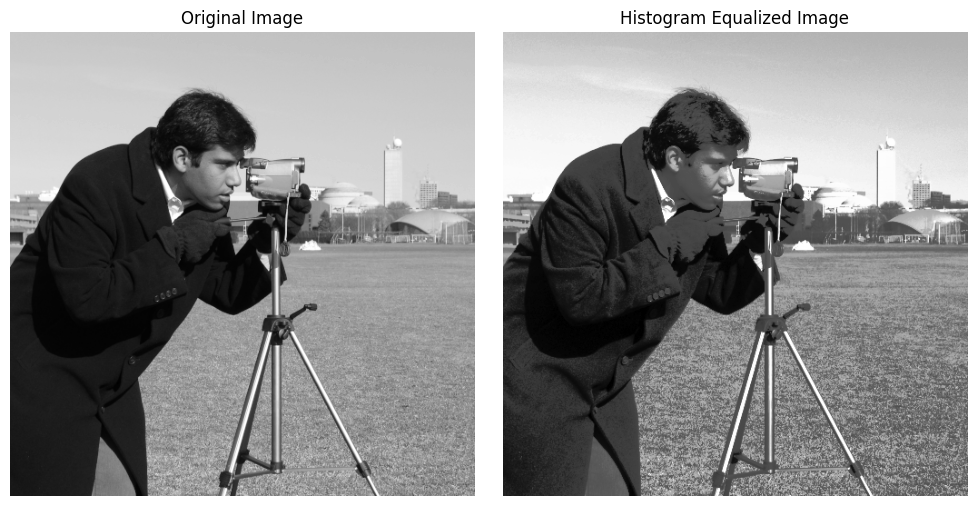

In [ ]:
def plot_histogram(image, title='Histogram'):
    plt.hist(image.ravel(), bins=256, range=(0,255), color='black')
    plt.title(title)
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()
def histogram_equalization(image):
    return exposure.equalize_hist(image)

image = data.camera()
plot_histogram(image, 'Original Image Histogram')

equalized_img = histogram_equalization(image)
equalized_img_8bit = (equalized_img * 255).astype(np.uint8)

plot_histogram(equalized_img_8bit, 'Equalized Image Histogram')
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(equalized_img_8bit, cmap='gray')
plt.title('Histogram Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()


**(C) Explanation of Improvements From These Transformations and Histogram Equalization**
* Gray level transformations modify the pixel intensity values to enhance image details:
  
* Negative transformation inverts intensities, useful for enhancing details in bright regions.

* Log transformation expands dark pixel values and compresses brighter ones, improving visibility in dark areas.

* Power-law (gamma) transformation adjusts contrast nonlinearly. Gamma < 1 brightens, gamma > 1 darkens the image.

* Histogram equalization redistributes image intensities to span the full intensity range uniformly, improving overall contrast especially in images with poor or narrow intensity distributions.

* These techniques enhance image contrast and detail visibility, making features more distinguishable and improving the quality for both human viewing and further automated processing.

**Spatial Filtering (Linear and Non-linear Filters):**

**Implement and apply spatial filters such as average, Gaussian, and Laplacian filters.**

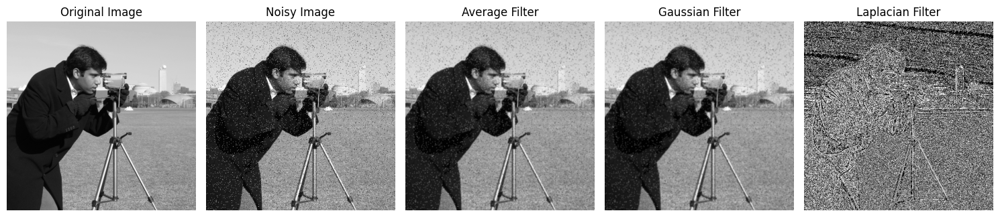

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve, gaussian_filter, laplace
from skimage import data, util

# Average filter (box filter) using a normalized kernel
def average_filter(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size**2)
    return convolve(image, kernel, mode='reflect')

# Gaussian filter using scipy function
def gaussian_filter_spatial(image, sigma=1):
    return gaussian_filter(image, sigma=sigma)

# Laplacian filter to enhance edges
def laplacian_filter(image):
    return laplace(image, mode='reflect')

image = data.camera()
noisy_image = util.random_noise(image, mode='s&p', amount=0.05)
noisy_image = (noisy_image * 255).astype(np.uint8)

avg_filtered = average_filter(noisy_image, kernel_size=3)
gauss_filtered = gaussian_filter_spatial(noisy_image, sigma=1)
laplacian_filtered = laplacian_filter(noisy_image)

plt.figure(figsize=(15,6))
plt.subplot(1,5,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,5,2)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')
plt.axis('off')

plt.subplot(1,5,3)
plt.imshow(avg_filtered, cmap='gray')
plt.title('Average Filter')
plt.axis('off')

plt.subplot(1,5,4)
plt.imshow(gauss_filtered, cmap='gray')
plt.title('Gaussian Filter')
plt.axis('off')

plt.subplot(1,5,5)
plt.imshow(laplacian_filtered, cmap='gray')
plt.title('Laplacian Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Write Python code for non-linear spatial filters such as median filtering and explain their role in noise reduction**

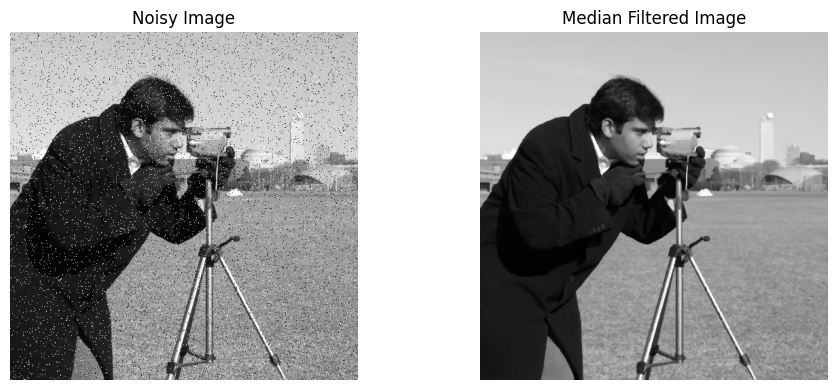

In [ ]:
from scipy.ndimage import median_filter
def median_filter_non_linear(image, kernel_size=3):
    return median_filter(image, size=kernel_size, mode='reflect')

median_filtered = median_filter_non_linear(noisy_image, kernel_size=3)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(median_filtered, cmap='gray')
plt.title('Median Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**Effect of Each Filter on Noisy Image**

* The average filter smooths noise but also blurs edges, causing loss of detail.

* The Gaussian filter provides smoother, natural blur, reducing noise with moderate edge preservation.

* The Laplacian filter emphasizes edges and highlights transitions but amplifies noise and is not a denoising filter.

* The median filter effectively removes salt-and-pepper noise while preserving edges and fine details, visually sharper than average or Gaussian filtered images.

**Image Degradation Model and Noise Characterization:**

**Create a Python function that simulates a degraded image by adding Gaussian noise, salt-and-pepper noise, and speckle noise**

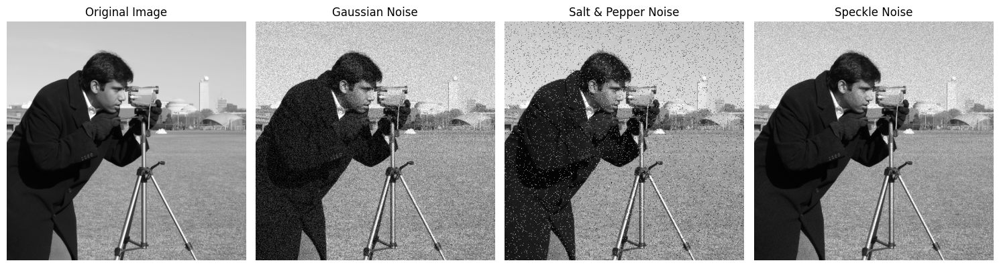

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, util

def add_noise(image, noise_type):
    if noise_type == 'gaussian':
        noisy = util.random_noise(image, mode='gaussian', var=0.01)
    elif noise_type == 's&p':
        noisy = util.random_noise(image, mode='s&p', amount=0.05)
    elif noise_type == 'speckle':
        noisy = util.random_noise(image, mode='speckle', var=0.01)
    else:
        raise ValueError("Unsupported noise type")

    return (noisy * 255).astype(np.uint8)

image = data.camera()
gaussian_noisy = add_noise(image, 'gaussian')
salt_pepper_noisy = add_noise(image, 's&p')
speckle_noisy = add_noise(image, 'speckle')

plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(gaussian_noisy, cmap='gray')
plt.title('Gaussian Noise')
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(salt_pepper_noisy, cmap='gray')
plt.title('Salt & Pepper Noise')
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(speckle_noisy, cmap='gray')
plt.title('Speckle Noise')
plt.axis('off')

plt.tight_layout()
plt.show()

**Describe different noise models and how they affect image quality.**

**Gaussian Noise:** Additive noise with a normal distribution (bell-shaped curve). It adds random variations to pixel intensities, causing a “grainy” appearance but preserving overall brightness patterns. Common in sensor systems.

**Salt-and-Pepper Noise:** Impulsive noise that randomly replaces pixels with black (pepper) or white (salt) dots. It causes sharp spikes and is visible as scattered black and white pixels, significantly degrading image clarity.

**Speckle Noise:** Multiplicative noise, common in coherent imaging systems (ultrasound, radar). It causes granular noise with multiplicative distortion affecting pixel intensities relative to local brightness, creating a “speckled” texture.

**Implement Wiener Filter for Noise Restoration and Apply on Noisy Image**

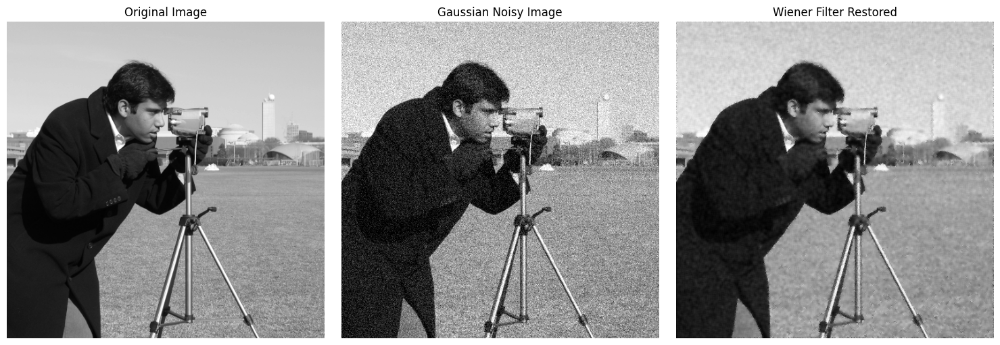

In [ ]:
from scipy.signal import wiener

def wiener_filter(image, mysize=5, noise=None):
    # Wiener filter expects float image scaled 0-1
    image_float = image / 255.0
    filtered = wiener(image_float, mysize=mysize, noise=noise)
    return (filtered * 255).astype(np.uint8)

restored_image = wiener_filter(gaussian_noisy, mysize=5)

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(gaussian_noisy, cmap='gray')
plt.title('Gaussian Noisy Image')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(restored_image, cmap='gray')
plt.title('Wiener Filter Restored')
plt.axis('off')

plt.tight_layout()
plt.show()

**Fourier Transform and Its Applications:**

**Write Python functions to compute the Discrete Fourier Transform (DFT) of an image using both the direct method and the Fast Fourier Transform (FFT).**

In [ ]:
import numpy as np
from skimage import data

def dft_direct(image):
    M, N = image.shape
    dft = np.zeros((M, N), dtype=complex)
    for u in range(M):
        for v in range(N):
            sum_val = 0
            for x in range(M):
                for y in range(N):
                    e = np.exp(-2j * np.pi * ((u * x / M) + (v * y / N)))
                    sum_val += image[x, y] * e
            dft[u, v] = sum_val
    return dft

def dft_fft(image):
    return np.fft.fft2(image)

image = data.camera()

**Plot the magnitude and phase spectra of the image in the frequency domain.**

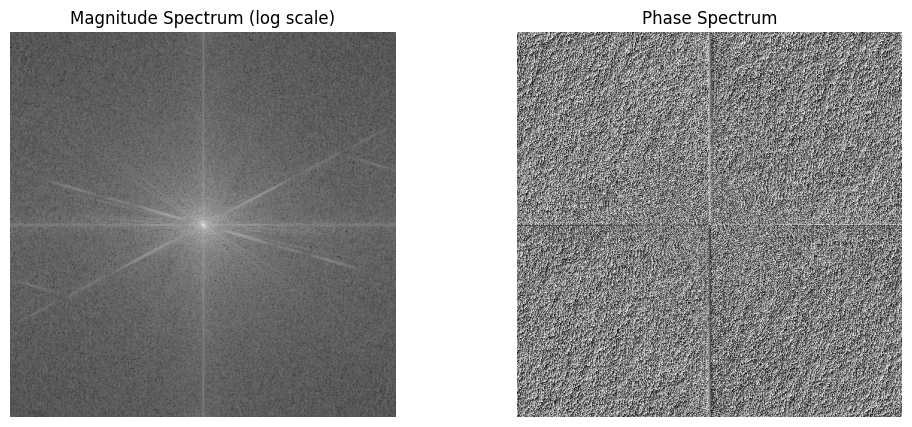

In [ ]:
import matplotlib.pyplot as plt

def plot_spectra(dft_result):
    dft_shifted = np.fft.fftshift(dft_result)

    magnitude = np.abs(dft_shifted)
    phase = np.angle(dft_shifted)

    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.imshow(np.log(1 + magnitude), cmap='gray')
    plt.title('Magnitude Spectrum (log scale)')
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(phase, cmap='gray')
    plt.title('Phase Spectrum')
    plt.axis('off')

    plt.show()

dft_result_fft = dft_fft(image)
plot_spectra(dft_result_fft)

**Implement Low-Pass Filter in Frequency Domain and Smooth Image**

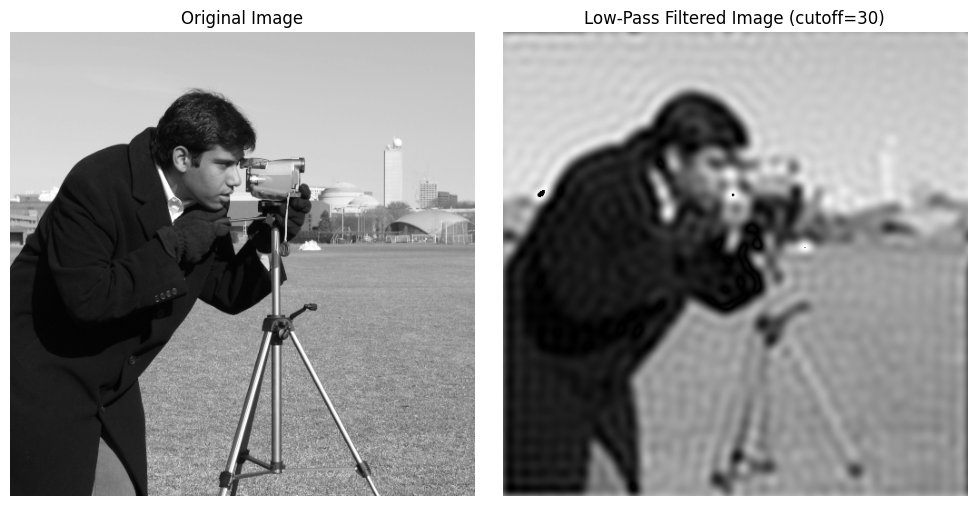

In [ ]:
def low_pass_filter(image, cutoff_radius):
    M, N = image.shape
    # FFT
    dft = np.fft.fft2(image)
    dft_shifted = np.fft.fftshift(dft)
    u = np.arange(M) - M // 2
    v = np.arange(N) - N // 2
    U, V = np.meshgrid(u, v, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    mask = np.zeros_like(image, dtype=float)
    mask[D <= cutoff_radius] = 1
    filtered_dft = dft_shifted * mask

    # Inverse FFT
    filtered_dft_ishift = np.fft.ifftshift(filtered_dft)
    img_back = np.fft.ifft2(filtered_dft_ishift)
    img_back = np.abs(img_back)

    return img_back.astype(np.uint8)

cutoff = 30
smoothed_image = low_pass_filter(image, cutoff)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(smoothed_image, cmap='gray')
plt.title(f'Low-Pass Filtered Image (cutoff={cutoff})')
plt.axis('off')

plt.tight_layout()
plt.show()

**Goertzel Algorithm and 2D DFT**

**Implement the Goertzel algorithm to compute the DFT of a signal for a specific frequency.**

In [ ]:
import numpy as np

def goertzel_algorithm(x, k):
    N = len(x)
    omega = (2 * np.pi * k) / N
    coeff = 2 * np.cos(omega)

    s_prev = 0
    s_prev2 = 0
    for n in range(N):
        s = x[n] + coeff * s_prev - s_prev2
        s_prev2 = s_prev
        s_prev = s
    dft_k = s_prev - np.exp(-1j * omega) * s_prev2
    return dft_k

x = np.array([1, 2, 3, 4, 2, 1, 0, 1])
k = 2
dft_val = goertzel_algorithm(x, k)
print(f"Goertzel DFT at bin {k}: {dft_val}")

Goertzel DFT at bin 2: (2-1.2246467991473532e-16j)


**Extend the concept to 2D DFT for image processing. Compute and display the 2D DFT and its inverse.**

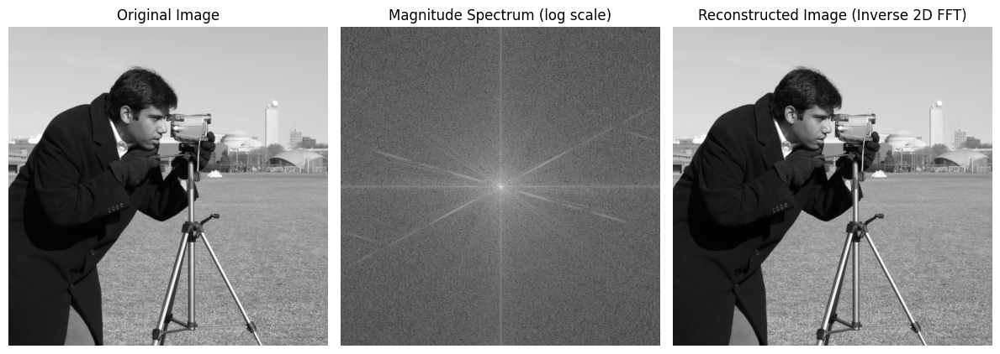

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

def dft_2d(image):
    M, N = image.shape
    # Compute DFT on rows using Goertzel along each frequency u
    row_dft = np.zeros((M, N), dtype=complex)
    for u in range(M):
        for n in range(M):
            row_signal = image[n, :]
            row_dft[n, u] = goertzel_algorithm(row_signal, u)
    # Compute DFT on columns for each frequency v
    dft = np.zeros((M, N), dtype=complex)
    for v in range(N):
        col_signal = row_dft[:, v]
        for m in range(M):
            dft[m, v] = goertzel_algorithm(col_signal, m)
    return dft
def dft_2d_fft(image):
    return np.fft.fft2(image)

def idft_2d_fft(dft):
    return np.fft.ifft2(dft)
image = data.camera()

# 2D FFT and inverse
dft_image = dft_2d_fft(image)
idft_image = idft_2d_fft(dft_image).real.astype(np.uint8)

plt.figure(figsize=(12,5))

plt.subplot(1,3,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(np.log1p(np.abs(np.fft.fftshift(dft_image))), cmap='gray')
plt.title('Magnitude Spectrum (log scale)')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(idft_image, cmap='gray')
plt.title('Reconstructed Image (Inverse 2D FFT)')
plt.axis('off')

plt.tight_layout()
plt.show()

# **Task 3: Filter Design and Frequency Domain Processing**

**Smoothing and Sharpening Filters:**

**Design smoothing and sharpening filters in the frequency domain. Apply them to an image and display the results.**

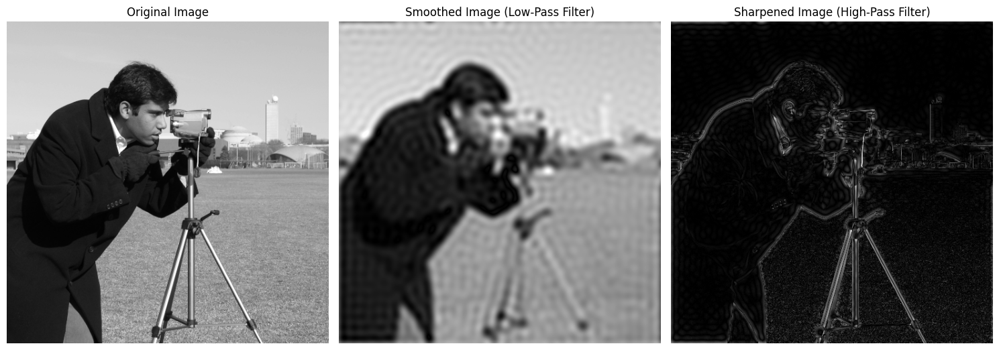

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

def ideal_low_pass_filter(shape, cutoff):
    M, N = shape
    u = np.arange(M) - M // 2
    v = np.arange(N) - N // 2
    U, V = np.meshgrid(u, v, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    mask = np.zeros((M, N))
    mask[D <= cutoff] = 1
    return mask

def ideal_high_pass_filter(shape, cutoff):
    return 1 - ideal_low_pass_filter(shape, cutoff)

def apply_frequency_filter(image, filter_mask):
    dft = np.fft.fft2(image)
    dft_shifted = np.fft.fftshift(dft)
    filtered_dft = dft_shifted * filter_mask
    dft_ishift = np.fft.ifftshift(filtered_dft)
    img_back = np.fft.ifft2(dft_ishift)
    img_back = np.abs(img_back)
    img_back = np.clip(img_back, 0, 255)
    return img_back.astype(np.uint8)
image = data.camera()
cutoff_frequency = 30
lp_filter = ideal_low_pass_filter(image.shape, cutoff_frequency)
hp_filter = ideal_high_pass_filter(image.shape, cutoff_frequency)

smoothed_img = apply_frequency_filter(image, lp_filter)
sharpened_img = apply_frequency_filter(image, hp_filter)

plt.figure(figsize=(15,6))
plt.subplot(1,3,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(smoothed_img, cmap='gray')
plt.title('Smoothed Image (Low-Pass Filter)')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(sharpened_img, cmap='gray')
plt.title('Sharpened Image (High-Pass Filter)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Discuss the impact of smoothing and sharpening filters on an image.**

**Smoothing Filters (Low-Pass Filters):**

* Reduce high-frequency components responsible for noise and fine detail.

* Result in images with less noise and blurred edges.

* Useful for noise reduction and preparing images for feature extraction.

* Excessive smoothing reduces important details, leading to loss of sharpness.

**Sharpening Filters (High-Pass Filters):**

* Enhance edges and fine details by emphasizing high-frequency components.

* Make images appear crisper with clearer transitions.

* Can highlight features like boundaries but also amplify noise.

* Useful in medical imaging, pattern recognition, and improving perceptual clarity.

**Homomorphic Filtering:**

**Implement a homomorphic filter to enhance the contrast of an image. Describe how homomorphic filtering works and the types of images it is useful for.**

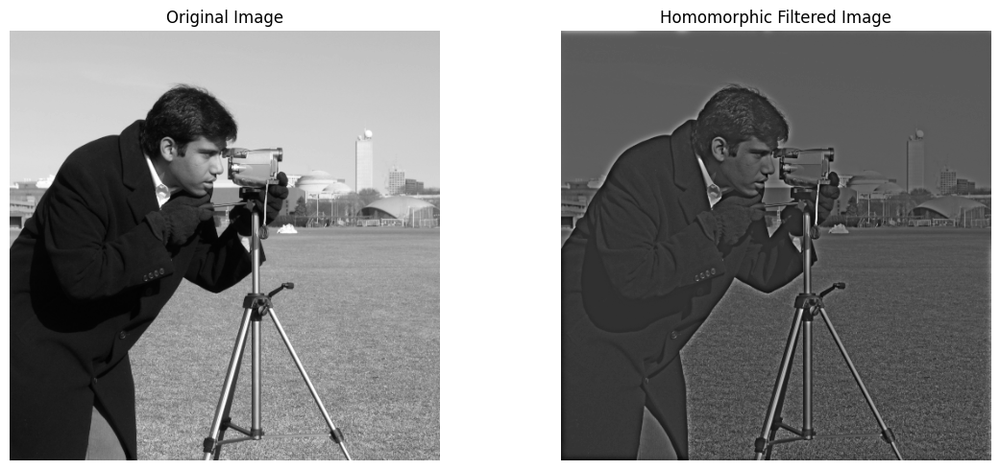

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, img_as_float

def homomorphic_filter(image, d0=30, rh=2.0, rl=0.5, c=1.0):
    img_log = np.log1p(image)

    img_fft = np.fft.fft2(img_log)
    img_fft_shift = np.fft.fftshift(img_fft)

    M, N = image.shape
    u = np.arange(M) - M // 2
    v = np.arange(N) - N // 2
    U, V = np.meshgrid(u, v, indexing='ij')
    D_sq = U**2 + V**2

    H = (rh - rl) * (1 - np.exp(-c * (D_sq / (d0**2)))) + rl

    filtered_fft = img_fft_shift * H

    # Inverse FFT
    filtered_fft_shift = np.fft.ifftshift(filtered_fft)
    img_filtered = np.fft.ifft2(filtered_fft_shift)
    img_filtered = np.real(img_filtered)
    img_exp = np.expm1(img_filtered)
    img_exp = (img_exp - np.min(img_exp)) / (np.max(img_exp) - np.min(img_exp))
    return img_exp
image = img_as_float(data.camera())

homomorphic_img = homomorphic_filter(image, d0=30, rh=2.0, rl=0.5, c=1.0)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(homomorphic_img, cmap='gray')
plt.title('Homomorphic Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**Design of Digital Filters (FIR and IIR):**

**Part A (FIR Filters): Design a low-pass FIR filter using the windowing method. Apply the filter to a noisy image and compare it to an unfiltered image.**

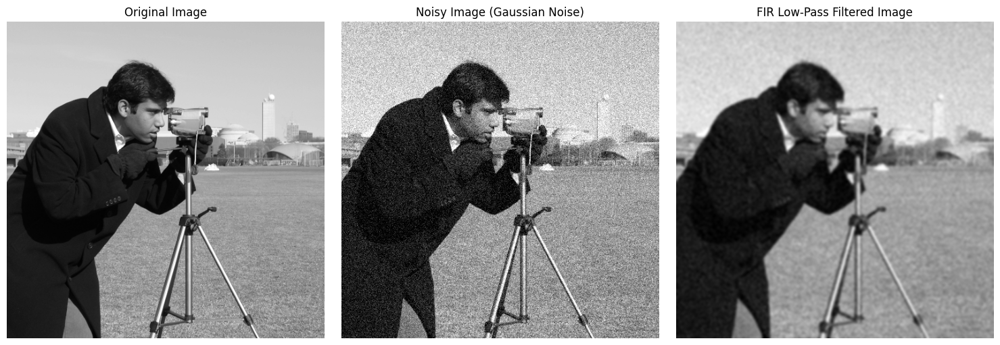

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import firwin, convolve2d
from skimage import data, util

image = data.camera()
noisy_image = util.random_noise(image, mode='gaussian', var=0.01)
noisy_image = (noisy_image * 255).astype(np.uint8)

def fir_lowpass_kernel(cutoff_freq, filter_order):
    fir_1d = firwin(filter_order, cutoff=cutoff_freq, window='hamming')
    kernel_2d = np.outer(fir_1d, fir_1d)
    kernel_2d /= np.sum(kernel_2d)
    return kernel_2d


cutoff_freq = 0.2
filter_order = 15
fir_kernel = fir_lowpass_kernel(cutoff_freq, filter_order)

filtered_image = convolve2d(noisy_image, fir_kernel, mode='same', boundary='symm')

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image (Gaussian Noise)')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(filtered_image, cmap='gray')
plt.title('FIR Low-Pass Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**Part B (IIR Filters): Design a low-pass Butterworth IIR filter from an analog prototype. Implement it as a digital filter using the bilinear transform method.**

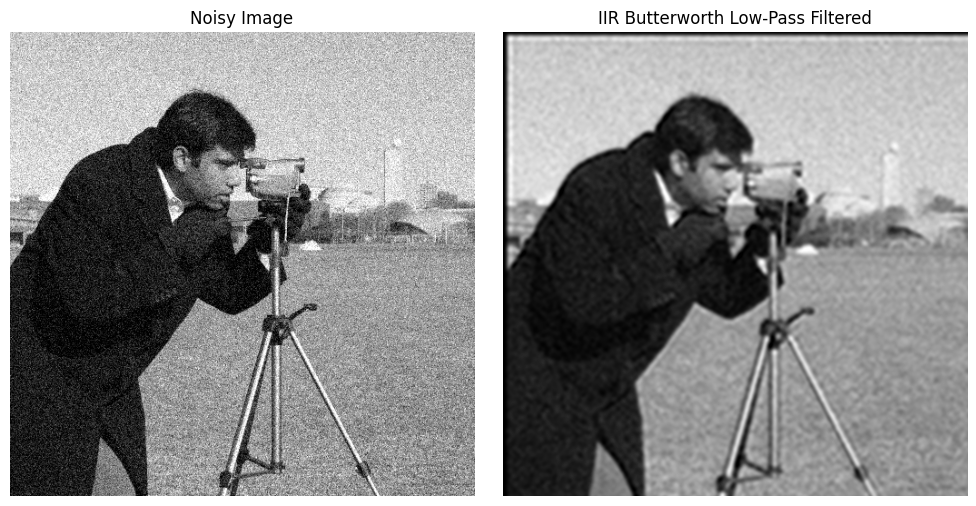

In [ ]:
from scipy.signal import butter, lfilter, freqz

def butter_lowpass(cutoff, fs, order=4):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def apply_iir_filter(image, b, a):
    filtered_rows = np.apply_along_axis(lambda m: lfilter(b, a, m), axis=1, arr=image)
    filtered_2d = np.apply_along_axis(lambda m: lfilter(b, a, m), axis=0, arr=filtered_rows)
    return filtered_2d

fs = 1.0
cutoff = 0.1

b, a = butter_lowpass(cutoff, fs, order=4)

iir_filtered_image = apply_iir_filter(noisy_image.astype(float), b, a)
iir_filtered_image = np.clip(iir_filtered_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(iir_filtered_image, cmap='gray')
plt.title('IIR Butterworth Low-Pass Filtered')
plt.axis('off')

plt.tight_layout()
plt.show()

**Part C: Design and apply a band-pass FIR filter to an image using the frequency sampling method. Compare the result with a simple low-pass filter.**

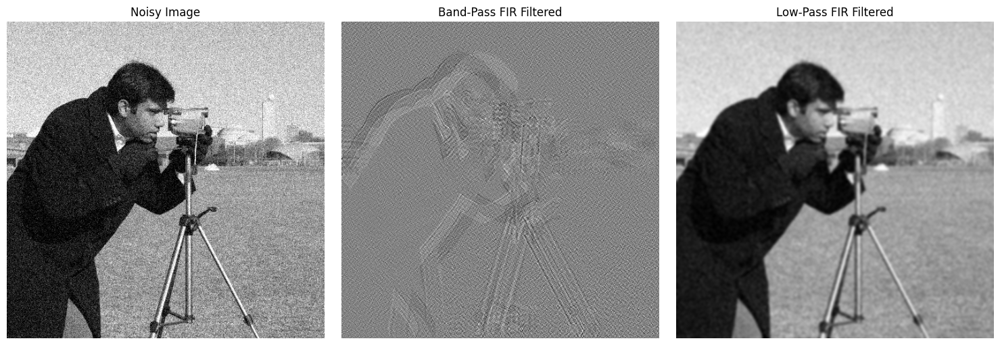

In [ ]:
from scipy.signal import freqz

def bandpass_fir_freq_sampling(M, f1, f2):
    h = np.zeros(M, dtype=complex)
    for k in range(M):
        freq = k/M
        if f1 <= freq <= f2 or f1 <= (1 - freq) <= f2:
            h[k] = 1
        else:
            h[k] = 0
    impulse_response = np.fft.ifft(h).real
    return impulse_response

M = 31
f1 = 0.1
f2 = 0.3

# 1D bandpass filter impulse response
bp_filter_1d = bandpass_fir_freq_sampling(M, f1, f2)

# 2D kernel from outer product
bp_filter_2d = np.outer(bp_filter_1d, bp_filter_1d)
bp_filter_2d /= np.sum(np.abs(bp_filter_2d))

bp_filtered_img = convolve2d(noisy_image, bp_filter_2d, mode='same', boundary='symm')

lp_filter_2d = fir_lowpass_kernel(cutoff_freq=0.2, filter_order=15)
lp_filtered_img = convolve2d(noisy_image, lp_filter_2d, mode='same', boundary='symm')

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(bp_filtered_img, cmap='gray')
plt.title('Band-Pass FIR Filtered')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(lp_filtered_img, cmap='gray')
plt.title('Low-Pass FIR Filtered')
plt.axis('off')

plt.tight_layout()
plt.show()

# **Task 4: Morphological Image Processing**

**Morphological Operations:**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, morphology, util, filters
from scipy.ndimage import binary_fill_holes
image_color = data.text()
image = image_color < 128  # threshold to get binary image

# Structuring element
selem = morphology.disk(3)

**DILATION**

In [ ]:
dilated = morphology.dilation(image, selem)

**EROSION**

In [ ]:
eroded = morphology.erosion(image, selem)

**OPENING**

In [ ]:
opened = morphology.opening(image, selem)

**CLOSING**

In [ ]:
closed = morphology.closing(image, selem)

**Hit-or-miss transformation**

In [ ]:
from scipy.ndimage import binary_hit_or_miss
hit_selem = np.array([[0,1,0],[1,1,1],[0,1,0]], dtype=bool)
miss_selem = None
hitormiss = binary_hit_or_miss(image, structure1=hit_selem, structure2=miss_selem)

**BOUNDARY EXTRACTION**

In [ ]:
boundary = image & ~eroded

**REGION FILLING**

In [ ]:
filled = binary_fill_holes(image)

**CONVEX HULL**

In [ ]:
convex_hull = morphology.convex_hull_image(image)

**THINNING**

In [ ]:
thinned = morphology.thin(image)

**THICKENING**

In [ ]:
from skimage.morphology import dilation

def thickening(image, selem, iterations=1):
    result = image.copy()
    for _ in range(iterations):
        dilated = dilation(result, selem)
        result = dilated | image
    return result

thickened = thickening(image, selem, iterations=1)

**SKELETONS**

In [ ]:
skeleton = morphology.skeletonize(image)

**PRUNING**

In [ ]:
pruned = morphology.medial_axis(image, return_distance=False)

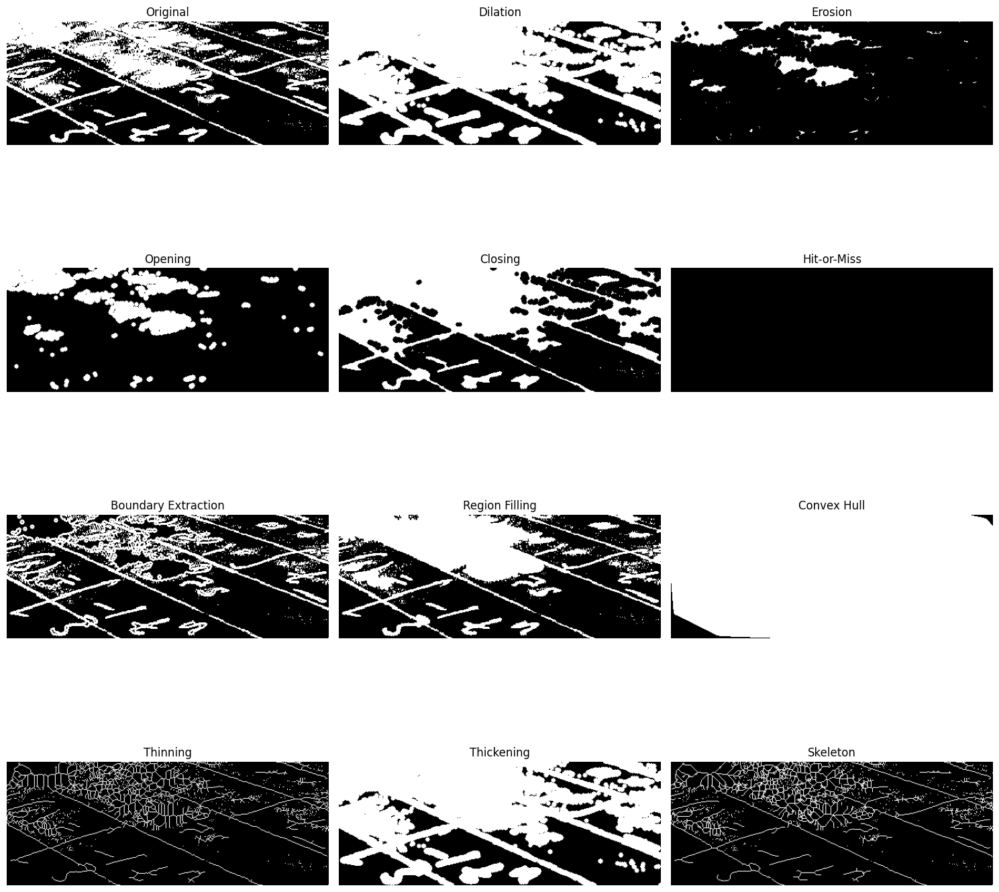

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(15, 16))
axes = axes.ravel()

titles = ['Original', 'Dilation', 'Erosion', 'Opening', 'Closing', 'Hit-or-Miss',
          'Boundary Extraction', 'Region Filling', 'Convex Hull', 'Thinning',
          'Thickening', 'Skeleton']

images = [image, dilated, eroded, opened, closed, hitormiss,
          boundary, filled, convex_hull, thinned,
          thickened, skeleton]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()

**Edge Models for Image Segmentation:**

**Implement edge-based segmentation techniques, such as the Sobel operator or Canny edge detector, and apply them to an image.**

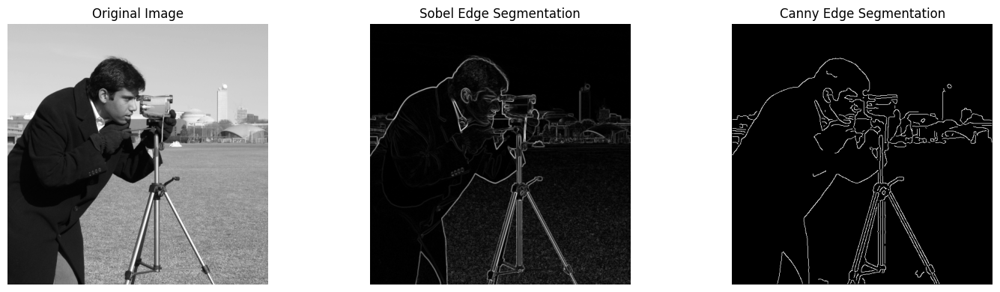

In [ ]:
import matplotlib.pyplot as plt
from skimage import data, filters, feature, color
image = data.camera()

# Sobel edge detection
sobel_edges = filters.sobel(image)

# Canny edge detection
canny_edges = feature.canny(image, sigma=2)

plt.figure(figsize=(15,4))
plt.subplot(1,3,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(sobel_edges, cmap='gray')
plt.title('Sobel Edge Segmentation')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(canny_edges, cmap='gray')
plt.title('Canny Edge Segmentation')
plt.axis('off')

plt.tight_layout()
plt.show()

**Implement region-based segmentation techniques (e.g., clustering-based segmentation, thresholding) and compare the results with edge-based methods.**

**Simple Thresholding (Otsu’s method):**

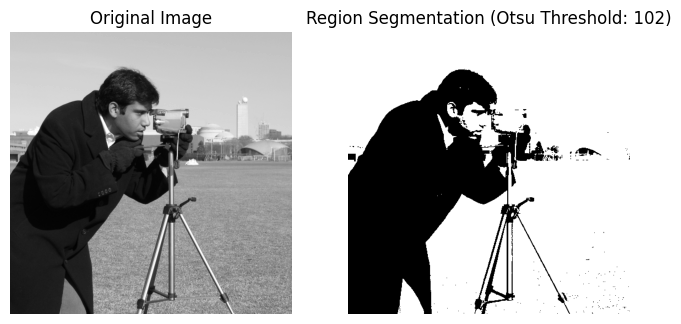

In [ ]:
from skimage.filters import threshold_otsu
thresh = threshold_otsu(image)
region_thresh = image > thresh

plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(region_thresh, cmap='gray')
plt.title(f'Region Segmentation (Otsu Threshold: {thresh})')
plt.axis('off')
plt.show()

**Clustering-based Segmentation (K-Means):**

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


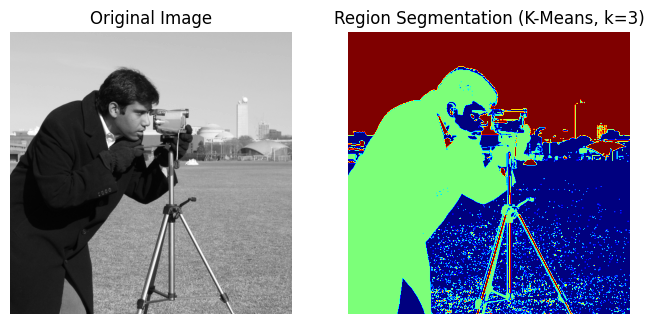

In [ ]:
from sklearn.cluster import KMeans
import numpy as np
pixels = image.reshape(-1,1).astype(np.float32)
kmeans = KMeans(n_clusters=3, random_state=0).fit(pixels)
labels = kmeans.labels_.reshape(image.shape)

plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(labels, cmap='jet')
plt.title('Region Segmentation (K-Means, k=3)')
plt.axis('off')
plt.show()